## Annotation of Mesenchyme subset

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# making sure plots & clusters are reproducible
np.random.seed(42)

# custom functions
import ma_codes as codes
from ma_codes import mysize, mymap, gray_red

Running Scanpy 1.6.1.dev110+gb4234d81, on 2021-03-04 14:13.


In [2]:
## path variables
adata_path = 'mnt/smb2/Niklas/GLPG_data_temp/subsets/210211_col1a1+_subset_NIKLAS.h5ad'

In [3]:
## plotting variables
sc.settings.figdir = '/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mesenchyme_subset'
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## load anndata object
adata = sc.read(adata_path)

In [5]:
## have a look at the adata object
adata

AnnData object with n_obs × n_vars = 14330 × 25194
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'GLPG_annotation', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2'
    var: 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'GLPG_annotation_colors', 'cluster_03_colors', 'condition_colors', 'hvg', 'identifier_colors', 'louvain', 'louvain_1_colors', 'neighbors', 'pca', 'time_point_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'unsouped_counts'
    obsp: 'connectivities', 'distances'

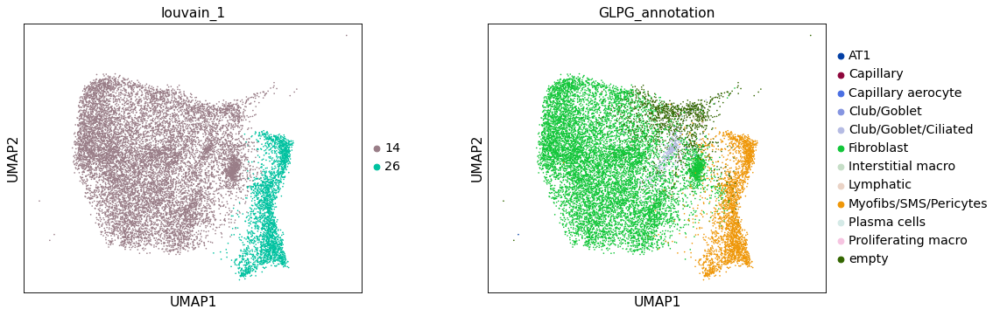

In [6]:
## overview plot
sc.pl.umap(adata, color = ['louvain_1', 'GLPG_annotation'], wspace = .25)

In [7]:
## remove unwanted noise
adata = adata[adata.obs['GLPG_annotation'].isin(['Fibroblast','Myofibs/SMS/Pericytes','Club/Goblet/Ciliated'])]

### Calculate HVGs

In [8]:
## delete all obs colums related to highly variable genes
del(adata.var['highly_variable'])
del(adata.var['highly_variable_nbatches'])
del(adata.var['highly_variable_intersection'])

In [9]:
## filter genes
sc.pp.filter_genes(adata, min_counts = 1)
sc.pp.filter_genes(adata, min_cells = 10)

filtered out 4396 genes that are detected in less than 1 counts
Trying to set attribute `.var` of view, copying.
filtered out 2896 genes that are detected in less than 10 cells


extracting highly variable genes
/home/agando/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
    finished (0:00:18)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
/home/agando/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


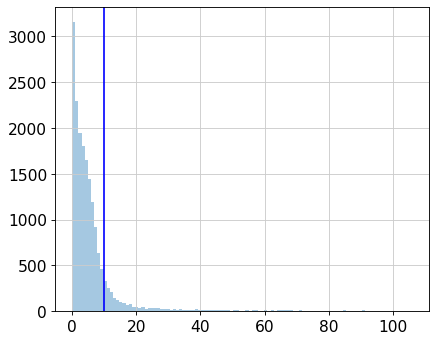

In [10]:
## compute HVGs per batch ('identifier') using seurat method
batch = 'identifier'
sc.pp.highly_variable_genes(adata, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 1000, n_bins = 20, flavor = 'seurat', 
                                subset = False)
vartab = pd.DataFrame(adata.var['highly_variable_nbatches'], index = adata.var_names)
sb.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))
plt.axvline(10, color = "blue")

In [11]:
## only consider a gene as variable if variable in at least 10 batches
thresh = 7
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print('%s Genes kept, variable in at least %s samples' %(len(hvgs), thresh))

4411 Genes kept, variable in at least 7 samples


In [12]:
## remove cell cycle genes (MOUSE) from list of HVGs
cc_genes = [x.strip().capitalize() for x in open('/home/agando/Documents/Meshal/PhD_Scripts/' +
                                                 'for_orientation/regev_lab_cell_cycle_genes.txt')]
hvgs = np.setdiff1d(hvgs, cc_genes)

In [13]:
## set HVGs
adata.var['highly_variable'] = [g in hvgs for g in adata.var_names]
## no. of resulting HVGs
sum(adata.var['highly_variable'])

4353

In [14]:
## check if Malat1 is in HVGs
adata.var['highly_variable']['Malat1']

False

In [15]:
## check if Sftpc is in HVGs
adata.var['highly_variable']['Sftpc']

True

In [16]:
## check if S100a6 is in HVGs
adata.var['highly_variable']['S100a6']

True

In [17]:
## remove Sftpc and s100a6 from HVGs
adata.var['highly_variable']['Sftpc'] = False
adata.var['highly_variable']['S100a6'] = False

/home/agando/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/agando/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [18]:
adata

AnnData object with n_obs × n_vars = 13102 × 17902
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'GLPG_annotation', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2'
    var: 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'GLPG_annotation_colors', 'cluster_03_colors', 'condition_colors', 'hvg', 'identifier_colors', 'louvain', 'louvain_1_colors', 'neighbors', 'pca', 'time_point_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'unsouped_counts'
    obsp: 'connectivities', 'distances'

In [19]:
adata.obs.treatment.value_counts()

none          5076
Nintedanib    1739
Combo         1692
GLPG1205      1680
GLPG1690      1556
vehicle       1359
Name: treatment, dtype: int64

### PCA

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


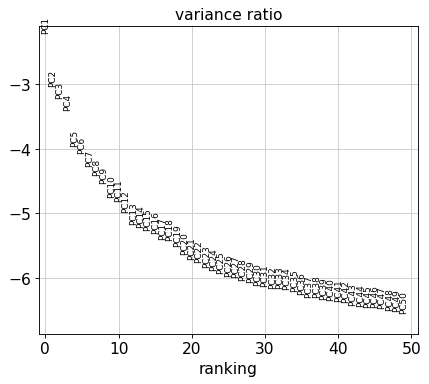

In [20]:
## PCA
sc.pp.pca(adata, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

### kNN graph

In [21]:
sc.pp.neighbors(adata, n_pcs = 50, n_neighbors = 10) # no batch correction

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


### Graph-based clustering and Visualization

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 20 clusters and added
    'sub_louvain', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


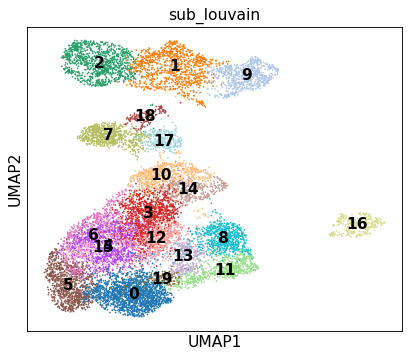

In [22]:
sc.tl.louvain(adata, resolution = 1.5, key_added = 'sub_louvain')
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['sub_louvain'], legend_loc = 'on data')

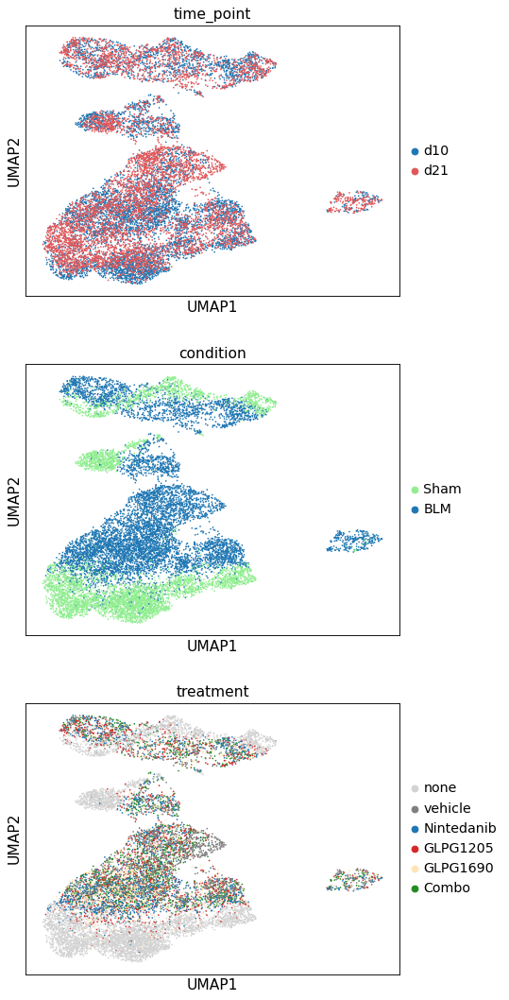

In [23]:
sc.pl.umap(adata, color = ['time_point', 'condition', 'treatment'], ncols = 1)

### Plot QC metrics

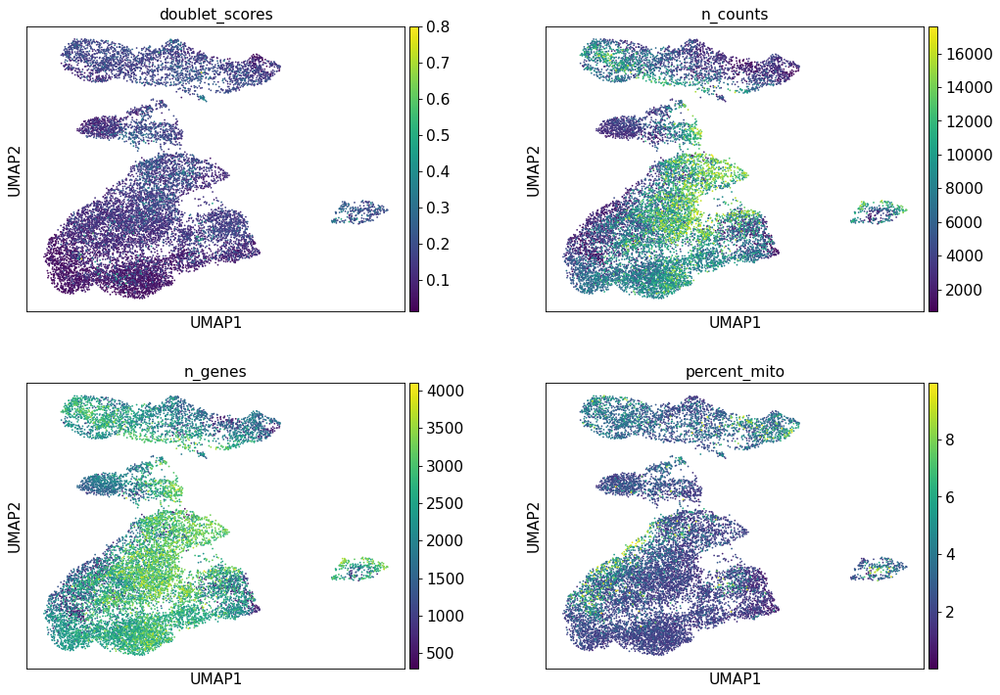

In [24]:
sc.pl.umap(adata, color = ['doublet_scores', 'n_counts', 'n_genes', 'percent_mito'], ncols = 2, wspace = 0.25, size = 10)

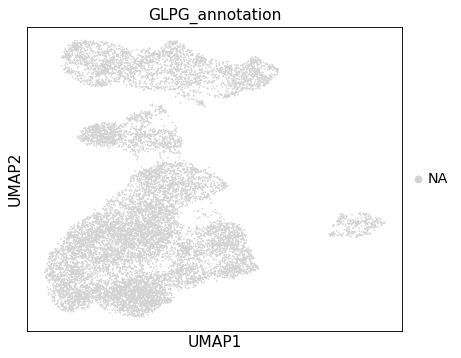

In [25]:
sc.pl.umap(adata, color = 'GLPG_annotation', groups = 'empty', color_map=gray_red)

### Plot marker genes

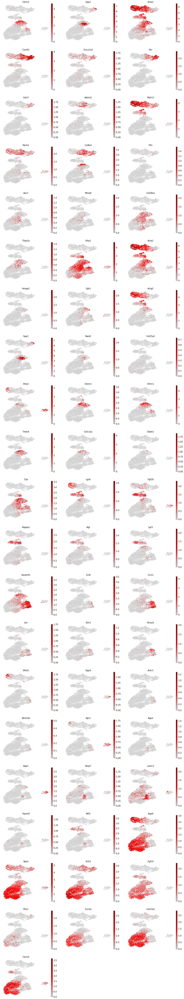

In [26]:
sc.pl.umap(adata, color = ["Cthrc1","Spp1","Acta2", "Cox4i2","Gucy1a2","Vtn","Sstr2",
                           "Adora1","Myh11","Parm1","Col8a1","Flt1",
                           "Aoc1","Mmp8","Col28a1","Tfap2a","Sfrp1",
                           "Acta2","Hmga2","Gjb3","Actg2",
                           "Spp1","Nwd2","Col25a1","Sfrp2","Grem1",
                           "Cthrc1","Thbs4","Col11a1","Ddah1","Cilp",
                           "Lgr6","Fgf18","Pappa2","Agt","Lgr5",
                           "Serpinf1","Ccl8","Ccl11","Iyd","Zim1","Shisa3",
                           "Efhd1","Dpp4","Ackr1","Wnt10b","Npr1",
                           "Aqp2","Aqp1","Bmp7","Lamc3","Tspan8","Wif1",
                           "Itga8","Npnt","Tcf21","Fgf10","Plin2","Scn3a","Col13a1","Ces1d"
                          ], ncols=3, size=20, frameon = False,
           color_map=gray_red)

### Compute marker genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:18)


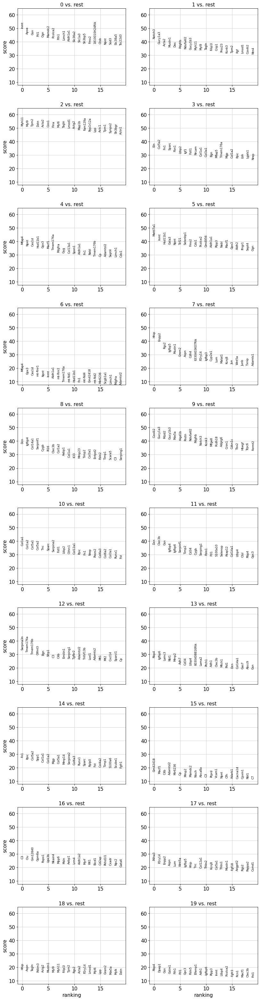

In [27]:
sc.tl.rank_genes_groups(adata, groupby = 'sub_louvain', groups = 'all', use_raw = True, method = 'wilcoxon', 
                        n_genes=100)
sc.pl.rank_genes_groups(adata, ncols = 2)

### Cell type annotation

... storing 'cell_type' as categorical


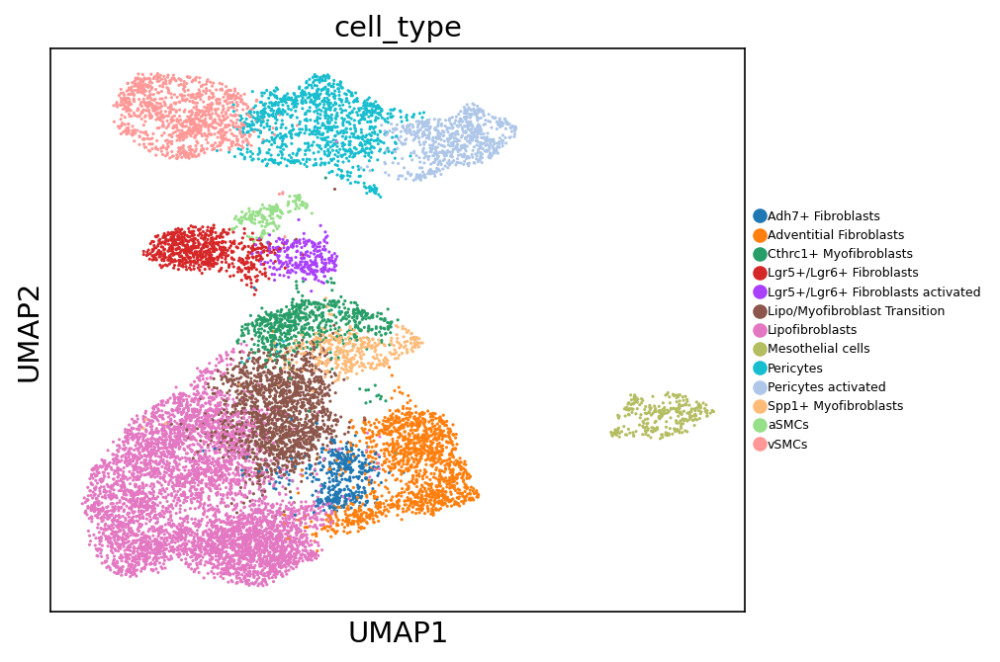

In [28]:
cell_type = {'0': 'Lipofibroblasts',
         '1': 'Pericytes',
         '2': 'vSMCs',
         '3': 'Lipo/Myofibroblast Transition',
         '4': 'Lipofibroblasts',
         '5': 'Lipofibroblasts',
         '6': 'Lipofibroblasts',
         '7': 'Lgr5+/Lgr6+ Fibroblasts',
         '8': 'Adventitial Fibroblasts',
         '9': 'Pericytes activated',
         '10': 'Cthrc1+ Myofibroblasts',
         '11': 'Adventitial Fibroblasts',
         '12': 'Lipo/Myofibroblast Transition',
         '13': 'Adh7+ Fibroblasts',
         '14': 'Spp1+ Myofibroblasts',
         '15': 'Lipofibroblasts',
         '16': 'Mesothelial cells',
         '17': 'Lgr5+/Lgr6+ Fibroblasts activated',
         '18': 'aSMCs',
         '19': 'Lipofibroblasts'
        }
adata.obs['cell_type'] = [cell_type[cluster] for cluster in adata.obs['sub_louvain']]
sc.pl.umap(adata, color = 'cell_type', ax = mysize(6, 5, 150), legend_fontsize = 6)

### Re-calculate markers (of final annotated cell type clusters)

In [29]:
## All Markers
sc.tl.rank_genes_groups(adata, groupby = 'cell_type', n_genes = 500, groups = 'all',
                        use_raw = True, method = 'wilcoxon')

## Combine into one Data Frame (comparable to Marker Table)
result = adata.uns['rank_genes_groups']
allMarkers = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({'gene': result['names'][cluster], 'score': result['scores'][cluster],
                            'logfoldchange': result['logfoldchanges'][cluster], 'pval': result['pvals'][cluster],
                            'pval_adj': result['pvals_adj'][cluster], 'cell_type': cluster})
    allMarkers.append(current)
allMarkers = pd.concat(allMarkers)
allMarkers.head()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


,gene,score,logfoldchange,pval,pval_adj,cell_type
0,Rbp4,27.588020,3.848234,1.549319e-167,2.773590e-163,Adh7+ Fibroblasts
1,Igfbp6,26.478954,2.845634,1.693855e-154,1.516170e-150,Adh7+ Fibroblasts
2,Lamc3,25.310017,4.499888,2.478056e-141,1.478739e-137,Adh7+ Fibroblasts
3,Nbl1,25.263018,2.218739,8.148165e-141,3.646711e-137,Adh7+ Fibroblasts
4,Mmp2,24.992188,2.379518,7.434028e-138,2.661679e-134,Adh7+ Fibroblasts


In [30]:
## filter
allMarkers = allMarkers[allMarkers.pval_adj < 0.1].copy()
allMarkers.cell_type.value_counts()

vSMCs                                500
Cthrc1+ Myofibroblasts               500
aSMCs                                500
Adventitial Fibroblasts              500
Lipo/Myofibroblast Transition        500
Mesothelial cells                    500
Lgr5+/Lgr6+ Fibroblasts              500
Spp1+ Myofibroblasts                 500
Lipofibroblasts                      500
Adh7+ Fibroblasts                    500
Lgr5+/Lgr6+ Fibroblasts activated    500
Pericytes activated                  500
Pericytes                            500
Name: cell_type, dtype: int64

In [31]:
## save marker table
out_dir = '/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Data/'
allMarkers.to_csv(out_dir + 'marker_table_GLPG_mesenchyme_subset_NIKLAS.csv', sep = '\t', index = False)

### Summary figures

In [32]:
adata.obs.cell_type.cat.categories

Index(['Adh7+ Fibroblasts', 'Adventitial Fibroblasts',
       'Cthrc1+ Myofibroblasts', 'Lgr5+/Lgr6+ Fibroblasts',
       'Lgr5+/Lgr6+ Fibroblasts activated', 'Lipo/Myofibroblast Transition',
       'Lipofibroblasts', 'Mesothelial cells', 'Pericytes',
       'Pericytes activated', 'Spp1+ Myofibroblasts', 'aSMCs', 'vSMCs'],
      dtype='object')

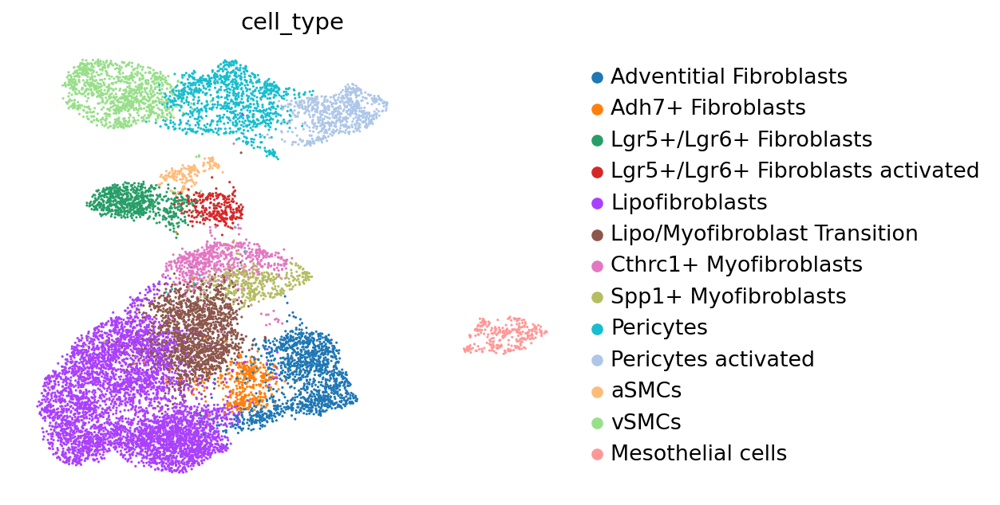

In [33]:
## change order of cell type labels
adata.obs['cell_type'] = adata.obs['cell_type'].cat.reorder_categories(['Adventitial Fibroblasts',
                                                                        'Adh7+ Fibroblasts',
                                                                        'Lgr5+/Lgr6+ Fibroblasts',
                                                                        'Lgr5+/Lgr6+ Fibroblasts activated',
                                                                        'Lipofibroblasts',
                                                                        'Lipo/Myofibroblast Transition',
                                                                        'Cthrc1+ Myofibroblasts',
                                                                        'Spp1+ Myofibroblasts',
                                                                        'Pericytes',
                                                                        'Pericytes activated',
                                                                        'aSMCs',
                                                                        'vSMCs',
                                                                        'Mesothelial cells'])
sc.pl.umap(adata, color = 'cell_type', ax = mysize(6, 5, 150), frameon = False)

... storing 'cell_type_compact' as categorical


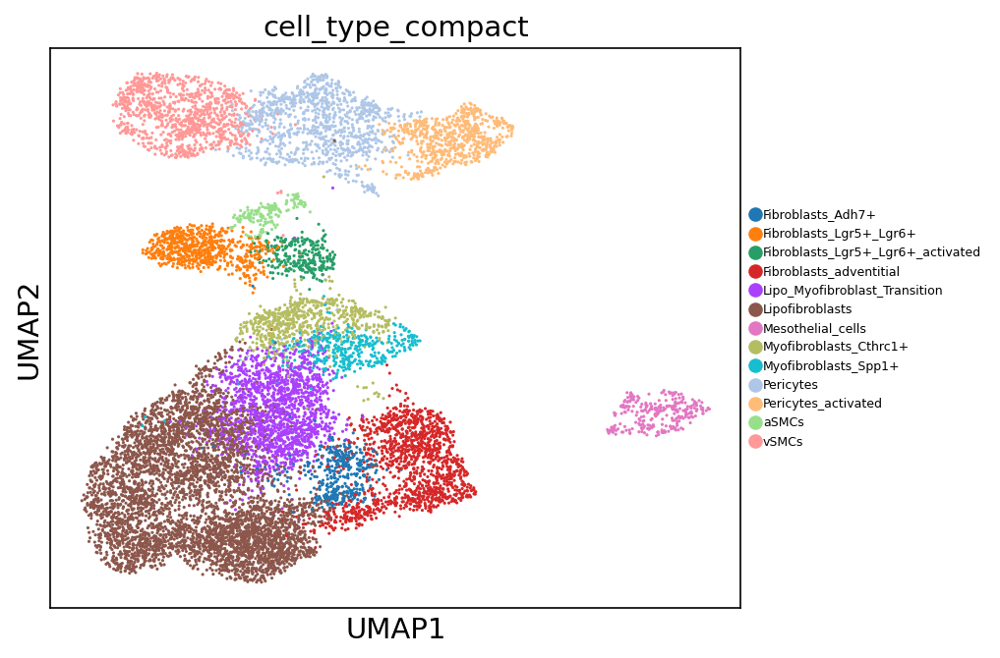

In [34]:
## special regex compatible cell type labels for GLPG :)
cell_type_conversion = {'Adventitial Fibroblasts' : 'Fibroblasts_adventitial',
                        'Adh7+ Fibroblasts' : 'Fibroblasts_Adh7+',
                        'Lgr5+/Lgr6+ Fibroblasts' : 'Fibroblasts_Lgr5+_Lgr6+',
                        'Lgr5+/Lgr6+ Fibroblasts activated' : 'Fibroblasts_Lgr5+_Lgr6+_activated',
                        'Lipofibroblasts' : 'Lipofibroblasts',
                        'Lipo/Myofibroblast Transition' : 'Lipo_Myofibroblast_Transition',
                        'Cthrc1+ Myofibroblasts' : 'Myofibroblasts_Cthrc1+',
                        'Spp1+ Myofibroblasts' : 'Myofibroblasts_Spp1+',
                        'Pericytes' : 'Pericytes',
                        'Pericytes activated' : 'Pericytes_activated',
                        'aSMCs' : 'aSMCs',
                        'vSMCs' : 'vSMCs',
                        'Mesothelial cells' : 'Mesothelial_cells'
                       }
adata.obs['cell_type_compact'] = [cell_type_conversion[cluster] for cluster in adata.obs['cell_type']]
sc.pl.umap(adata, color = 'cell_type_compact', ax = mysize(6, 5, 150), legend_fontsize = 6)

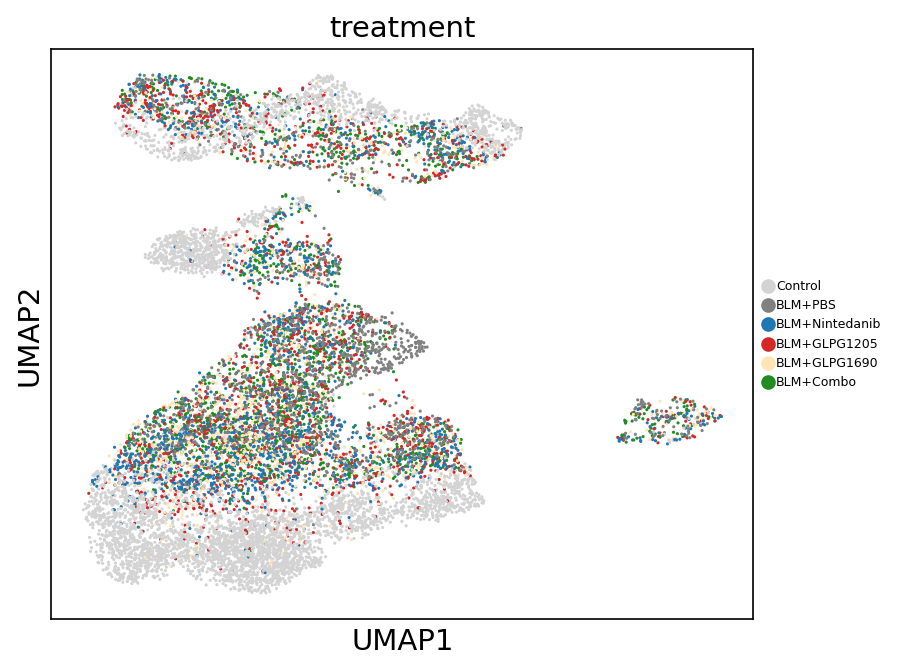

In [35]:
# rename condition label upon request of GLPG :)
treatment_conversion = {'none' : 'Control',
                        'vehicle' : 'BLM+PBS',
                        'Nintedanib' : 'BLM+Nintedanib',
                        'GLPG1205' : 'BLM+GLPG1205',
                        'GLPG1690' : 'BLM+GLPG1690',
                        'Combo' : 'BLM+Combo'
}
adata.obs['treatment'] = [treatment_conversion[t] for t in adata.obs['treatment']]
## reorder condition labels
adata.obs['treatment'] = adata.obs['treatment'].astype('category')
adata.obs['treatment'] = adata.obs['treatment'].cat.reorder_categories(['Control','BLM+PBS',
                                                                        'BLM+Nintedanib',
                                                                        'BLM+GLPG1205',
                                                                        'BLM+GLPG1690',
                                                                        'BLM+Combo'])
## plot UMAPs with new labels
sc.pl.umap(adata, color = 'treatment', ax = mysize(6, 5, 150), legend_fontsize = 6)

... storing 'treatment_time' as categorical


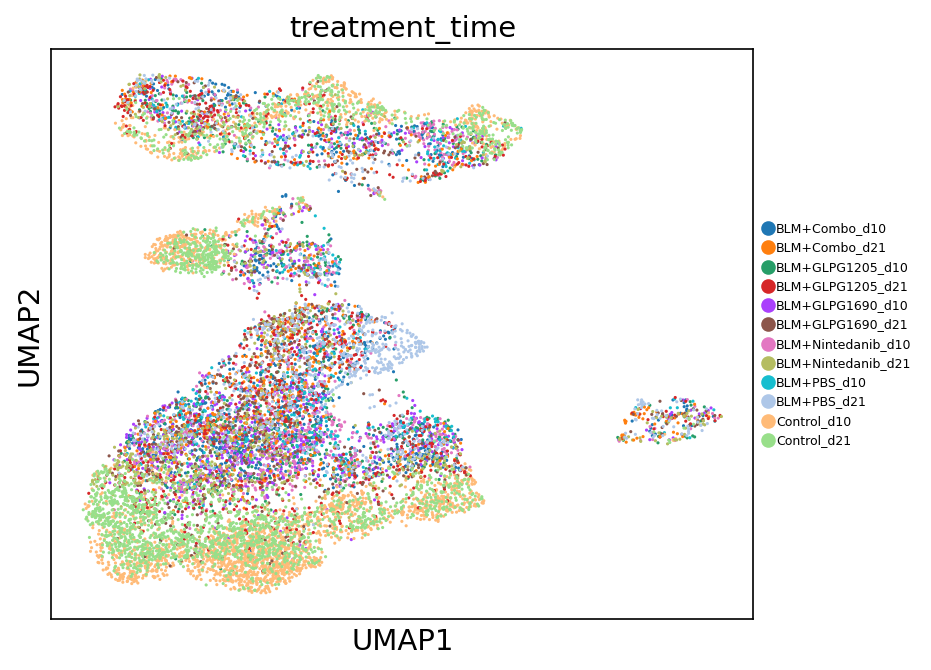

In [36]:
## rename treatment_time label upon request of GLPG :)
treatment_time_conversion = {'none_d10' : 'Control_d10',
                             'none_d21' : 'Control_d21',
                             'vehicle_d10' : 'BLM+PBS_d10',
                             'vehicle_d21' : 'BLM+PBS_d21',
                             'Nintedanib_d10' : 'BLM+Nintedanib_d10',
                             'Nintedanib_d21' : 'BLM+Nintedanib_d21',
                             'GLPG1205_d10' : 'BLM+GLPG1205_d10',
                             'GLPG1205_d21' : 'BLM+GLPG1205_d21',
                             'GLPG1690_d10' : 'BLM+GLPG1690_d10',
                             'GLPG1690_d21' : 'BLM+GLPG1690_d21',
                             'Combo_d10' : 'BLM+Combo_d10',
                             'Combo_d21' : 'BLM+Combo_d21'
}
adata.obs['treatment_time'] = [treatment_time_conversion[tt] for tt in adata.obs['treatment_time']]
sc.pl.umap(adata, color = 'treatment_time', ax = mysize(6, 5, 150), legend_fontsize = 6)

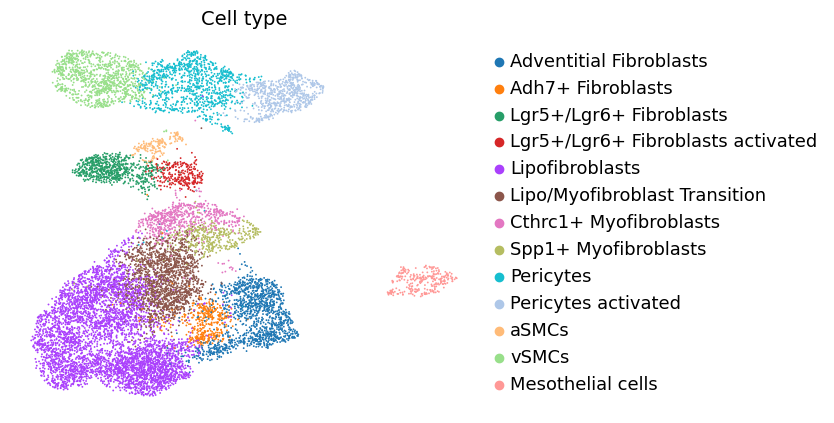

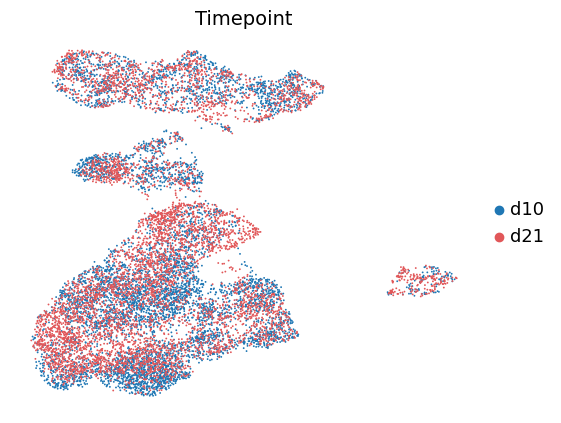

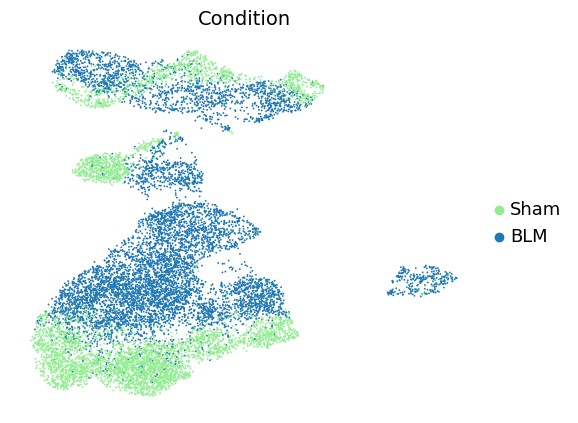

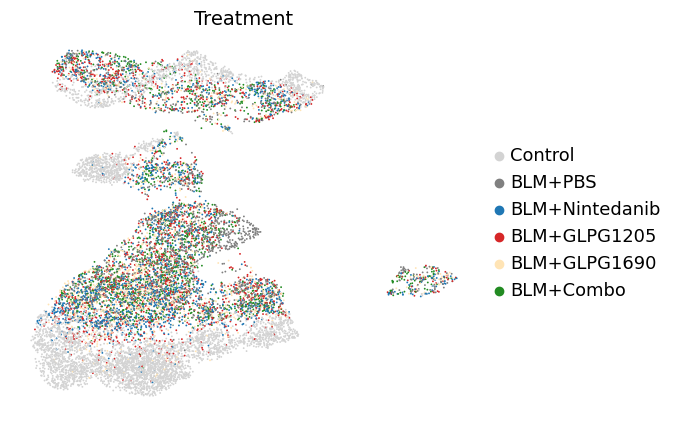

In [37]:
## save UMAP of Mesenchyme for future use
sc.pl.umap(adata, color = ['cell_type'], title = 'Cell type', frameon = False, 
           ax = mysize(6, 5, 100), size = 7, save = '_celltype.pdf')
sc.pl.umap(adata, color = ['time_point'], title = 'Timepoint', frameon = False, 
           ax = mysize(6, 5, 100), size = 7, save = '_timepoint.pdf')
sc.pl.umap(adata, color = ['condition'], title = 'Condition', frameon = False, 
           ax = mysize(6, 5, 100), size = 7, save = '_condition.pdf')
sc.pl.umap(adata, color = ['treatment'], title = 'Treatment', frameon = False, 
           ax = mysize(6, 5, 100), size = 7, save = '_treatment.pdf')

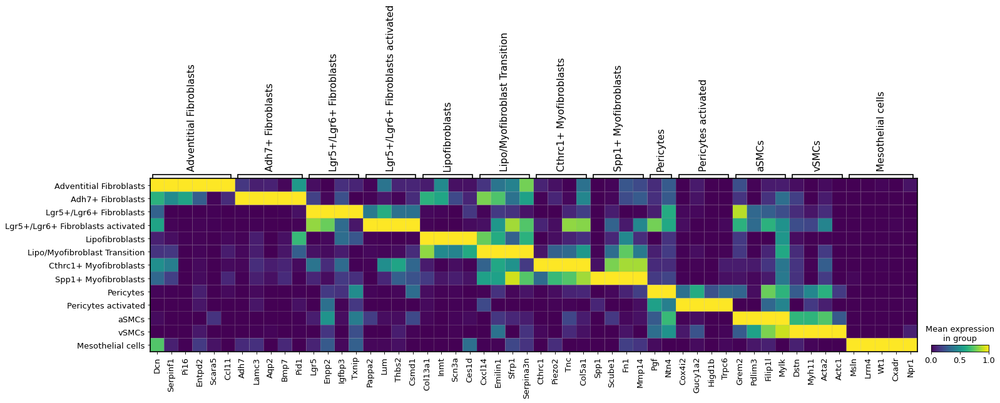

In [38]:
## custom heatmap
# matrixplot with marker genes
celltype_markers={'Adventitial Fibroblasts' : ['Dcn','Serpinf1','Pi16','Entpd2','Scara5','Ccl11'],
                  'Adh7+ Fibroblasts' : ['Adh7','Lamc3','Aqp2','Bmp7','Pid1'],
                  'Lgr5+/Lgr6+ Fibroblasts' : ['Lgr5','Enpp2','Igfbp3','Txnip'],
                  'Lgr5+/Lgr6+ Fibroblasts activated' : ['Pappa2','Lum','Thbs2','Csmd1'],
                  'Lipofibroblasts' : ['Col13a1','Inmt','Scn3a','Ces1d'],
                  'Lipo/Myofibroblast Transition' : ['Cxcl14','Emilin1','Sfrp1','Serpina3n'],
                  'Cthrc1+ Myofibroblasts' : ['Cthrc1','Piezo2','Tnc','Col5a1'],
                  'Spp1+ Myofibroblasts' : ['Spp1','Scube1','Fn1','Mmp14'],
                  'Pericytes' : ['Pgf','Ntn4'],
                  'Pericytes activated' : ['Cox4i2','Gucy1a2','Higd1b','Trpc6'],
                  'aSMCs' : ['Grem2','Pdlim3','Filip1l','Mylk'],
                  'vSMCs' : ['Dstn','Myh11','Acta2','Actc1'],
                  'Mesothelial cells' : ['Msln','Lrrn4','Wt1','Cxadr','Npr1']
}
sc.pl.matrixplot(adata, celltype_markers, groupby = 'cell_type',standard_scale='var',
                 dendrogram=False, save='curated_marker_matrix.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`


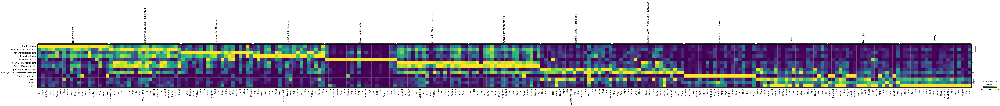

In [39]:
## automated heatmap
sc.tl.dendrogram(adata, groupby = 'cell_type')
#sc.tl.rank_genes_groups(adata, groupby = 'cell_type', method = 'wilcoxon')
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 20, standard_scale = 'var', save= 'auto_marker_matrix.pdf')

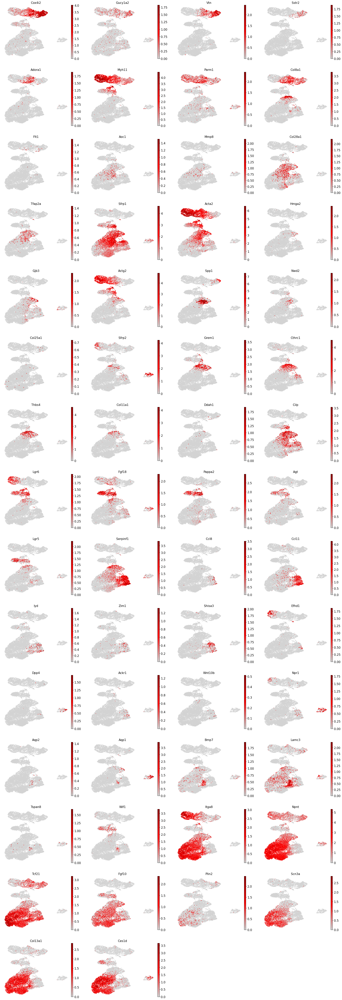

In [40]:
## save UMAP feature plot
sc.pl.umap(adata, color = ["Cox4i2","Gucy1a2","Vtn","Sstr2",
                           "Adora1","Myh11","Parm1","Col8a1","Flt1",
                           "Aoc1","Mmp8","Col28a1","Tfap2a","Sfrp1",
                           "Acta2","Hmga2","Gjb3","Actg2",
                           "Spp1","Nwd2","Col25a1","Sfrp2","Grem1",
                           "Cthrc1","Thbs4","Col11a1","Ddah1","Cilp",
                           "Lgr6","Fgf18","Pappa2","Agt","Lgr5",
                           "Serpinf1","Ccl8","Ccl11","Iyd","Zim1","Shisa3",
                           "Efhd1","Dpp4","Ackr1","Wnt10b","Npr1",
                           "Aqp2","Aqp1","Bmp7","Lamc3","Tspan8","Wif1",
                           "Itga8","Npnt","Tcf21","Fgf10","Plin2","Scn3a","Col13a1","Ces1d"
                          ], frameon = False, ncols = 4, cmap = gray_red, size = 25,
            save = '_mesenchyme_markers.pdf')

In [41]:
## frequency table
xlabel = 'treatment'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = codes.calc_relFreq(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,Adventitial Fibroblasts,Adh7+ Fibroblasts,Lgr5+/Lgr6+ Fibroblasts,Lgr5+/Lgr6+ Fibroblasts activated,Lipofibroblasts,Lipo/Myofibroblast Transition,Cthrc1+ Myofibroblasts,Spp1+ Myofibroblasts,Pericytes,Pericytes activated,aSMCs,vSMCs,Mesothelial cells,treatment
d100BLM_Combo48,0.028369,0.000000,0.000000,0.014184,0.148936,0.276596,0.134752,0.148936,0.056738,0.049645,0.000000,0.063830,0.078014,BLM+Combo
d100BLM_G120528,0.029412,0.022059,0.022059,0.080882,0.477941,0.191176,0.007353,0.000000,0.029412,0.080882,0.014706,0.044118,0.000000,BLM+GLPG1205


Saving Figure to /home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mesenchyme_subset/relfreqs_treatment.pdf


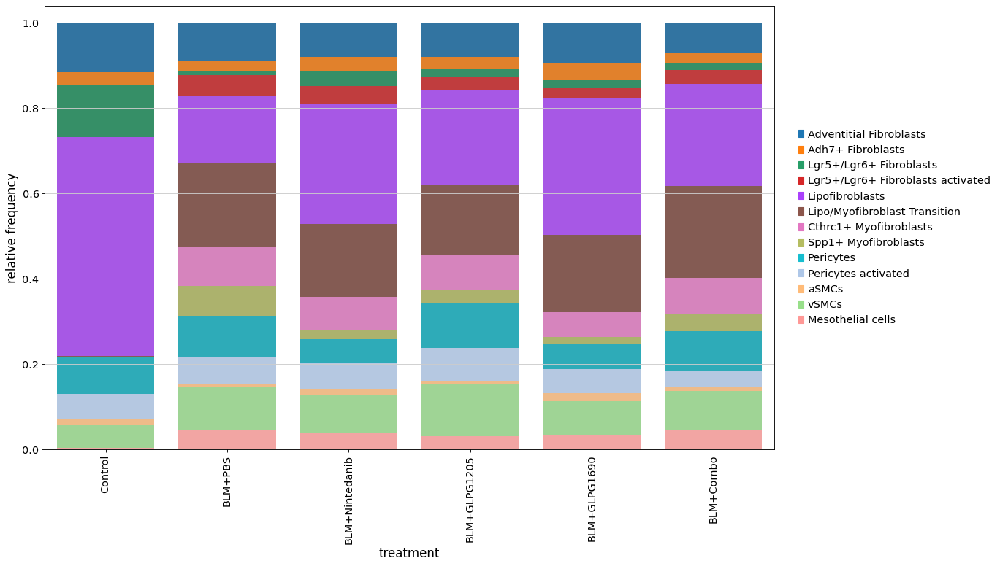

In [42]:
## cell type frequencies per treatment category
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (16,10), order = ['Control','BLM+PBS','BLM+Nintedanib','BLM+GLPG1205','BLM+GLPG1690','BLM+Combo'],
                               errbar = False, cols = cols, width = 0.8,
                               save='/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mesenchyme_subset/relfreqs_treatment.pdf')

In [43]:
## frequency table
xlabel = 'treatment_time'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = codes.calc_relFreq(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,Adventitial Fibroblasts,Adh7+ Fibroblasts,Lgr5+/Lgr6+ Fibroblasts,Lgr5+/Lgr6+ Fibroblasts activated,Lipofibroblasts,Lipo/Myofibroblast Transition,Cthrc1+ Myofibroblasts,Spp1+ Myofibroblasts,Pericytes,Pericytes activated,aSMCs,vSMCs,Mesothelial cells,treatment_time
d100BLM_Combo48,0.028369,0.000000,0.000000,0.014184,0.148936,0.276596,0.134752,0.148936,0.056738,0.049645,0.000000,0.063830,0.078014,BLM+Combo_d10
d100BLM_G120528,0.029412,0.022059,0.022059,0.080882,0.477941,0.191176,0.007353,0.000000,0.029412,0.080882,0.014706,0.044118,0.000000,BLM+GLPG1205_d10


Saving Figure to /home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mesenchyme_subset/relfreqs_treatment_time.pdf


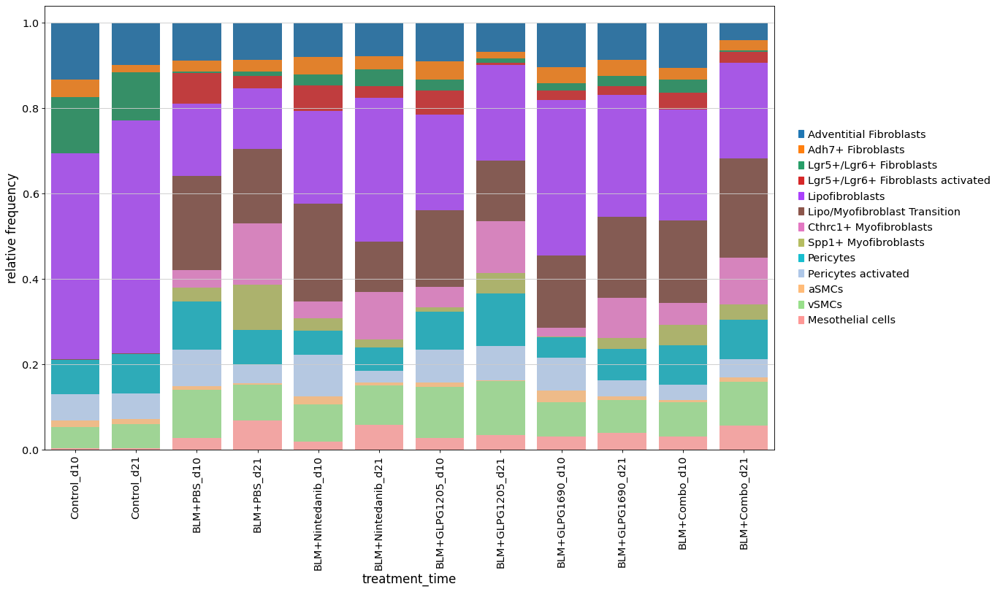

In [44]:
## cell type frequencies per treatment time category
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (16, 10),
            order = ['Control_d10','Control_d21','BLM+PBS_d10','BLM+PBS_d21','BLM+Nintedanib_d10','BLM+Nintedanib_d21',
                     'BLM+GLPG1205_d10','BLM+GLPG1205_d21','BLM+GLPG1690_d10','BLM+GLPG1690_d21','BLM+Combo_d10','BLM+Combo_d21'],
            errbar = False, cols = cols, width = 0.8, 
            save='/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mesenchyme_subset/relfreqs_treatment_time.pdf')

In [45]:
## frequency table
xlabel = 'condition'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = codes.calc_relFreq(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,Adventitial Fibroblasts,Adh7+ Fibroblasts,Lgr5+/Lgr6+ Fibroblasts,Lgr5+/Lgr6+ Fibroblasts activated,Lipofibroblasts,Lipo/Myofibroblast Transition,Cthrc1+ Myofibroblasts,Spp1+ Myofibroblasts,Pericytes,Pericytes activated,aSMCs,vSMCs,Mesothelial cells,condition
d100BLM_Combo48,0.028369,0.000000,0.000000,0.014184,0.148936,0.276596,0.134752,0.148936,0.056738,0.049645,0.000000,0.063830,0.078014,BLM
d100BLM_G120528,0.029412,0.022059,0.022059,0.080882,0.477941,0.191176,0.007353,0.000000,0.029412,0.080882,0.014706,0.044118,0.000000,BLM


Saving Figure to /home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mesenchyme_subset/relfreqs_condition.pdf


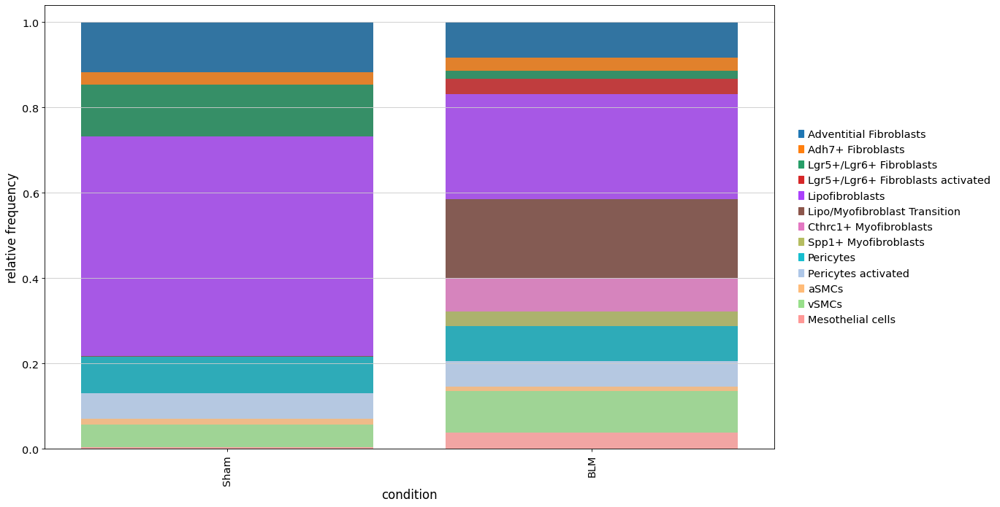

In [46]:
## cell type frequencies per treatment time category
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (16, 10),
            order = ['Sham','BLM'],
            errbar = False, cols = cols, width = 0.8, 
            save='/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/mesenchyme_subset/relfreqs_condition.pdf')

### Save annotated subset

In [47]:
## save adata object
adata.write('/mnt/platte_1/Projects/210115_GLPG/subsets/210218_mesenchyme_subset_NIKLAS_annotated.h5ad')